# Convolutions, Blurring and Sharpening

- convolutional operations + blurring
- denoising
- sharpening

---
### Imports and Helper-functions

In [2]:
import os
import random

import cv2
import numpy as np
import matplotlib.pyplot as plt

In [3]:
def imshow(img, title=None, size=10, axis=False, color_space="BGR"):
    aspect_ratio = img.shape[0] / img.shape[1]
    plt.figure(figsize=(size * aspect_ratio, size))
    if color_space.lower() == "bgr":
        rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    elif color_space.lower() == "rgb":
        rgb_img = img
    else:
        rgb_img = cv2.cvtColor(img, cv2.COLOR_HSV2RGB)
    plt.imshow(rgb_img)
    if type(title) == str:
        plt.title(title)
    if axis == False:
        plt.axis('off')
    plt.show()

In [22]:
def get_random_img_path(search_path='../../res/img', skip=["flickr"]):
    """
    This function searches for common image files in all subdirectories
    and return a random image path of them.
    """
    image_extensions = ['.jpg', '.jpeg', '.png', '.gif', '.bmp', '.tiff', '.ico']
    image_paths = []

    # Walk through all subdirectories
    for root, dirs, files in os.walk(search_path):
        for file_name in files:
            # Check if the file is an image
            if any(file_name.lower().endswith(ext) for ext in image_extensions):
                # Get the full file path
                full_path = os.path.join(root, file_name).replace("\\", "/")
                if not any(i in full_path for i in skip):
                    image_paths.append(full_path)

    return random.choice(image_paths)

# get an image
IMG_PATH = get_random_img_path(skip=["flickr", "weather", "gem"])
IMG_PATH   

'../../res/img/Lions/d35eb436350a6c04.jpg'

---
### Loading data

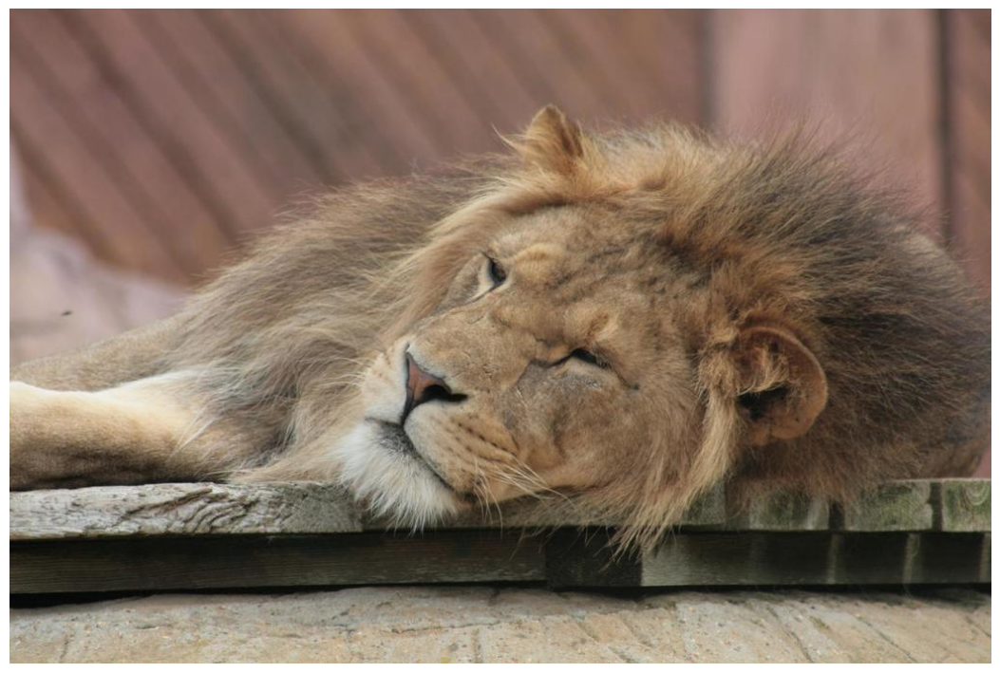

In [26]:
img = cv2.imread(IMG_PATH)
imshow(img, size=20)

---
### Blurring with convolutions

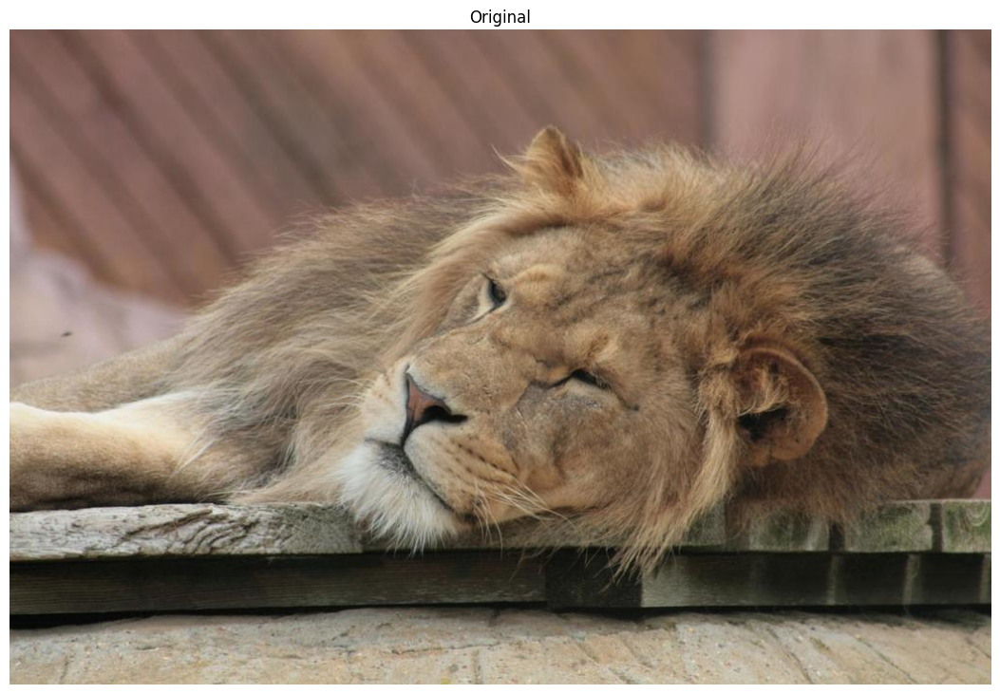

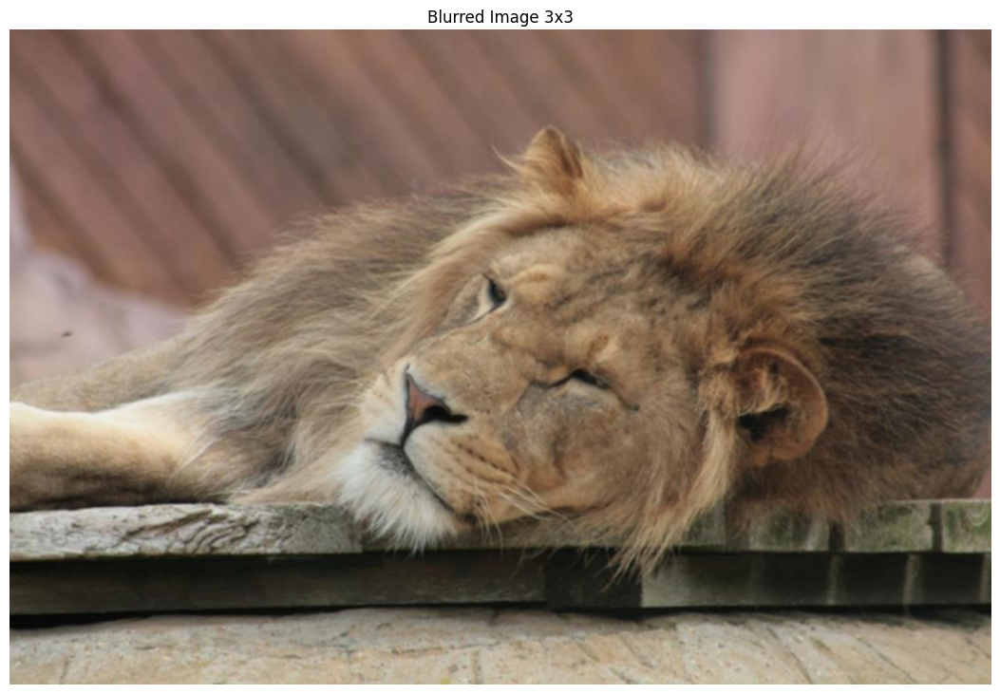

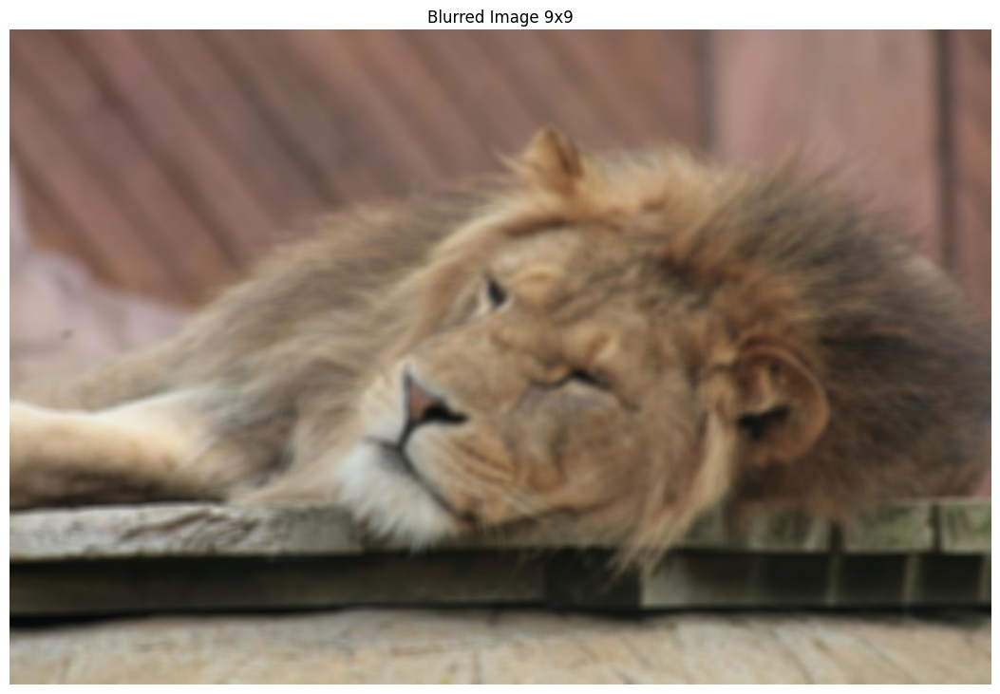

In [30]:
imshow(img, "Original", size=20)

kernel = np.ones((3, 3), np.float32) / 9
blurred_img = cv2.filter2D(img, -1, kernel)
imshow(blurred_img, "Blurred Image 3x3", size=20)

kernel = np.ones((9, 9), np.float32) / 81
blurred_img = cv2.filter2D(img, -1, kernel)
imshow(blurred_img, "Blurred Image 9x9", size=20)

---
### Blurring with cv2 blurring methods

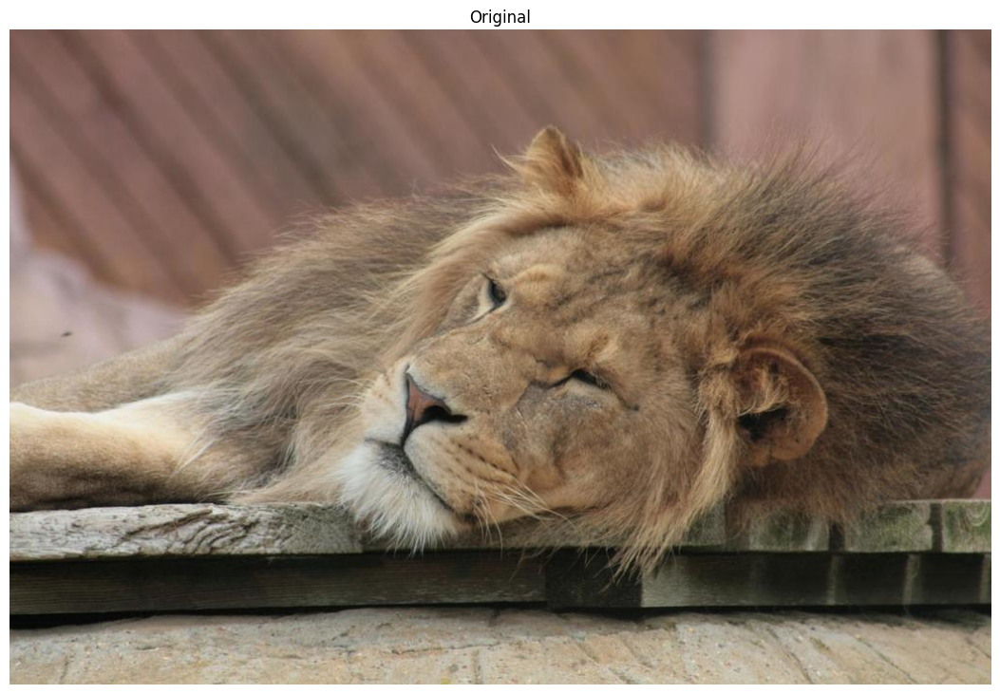

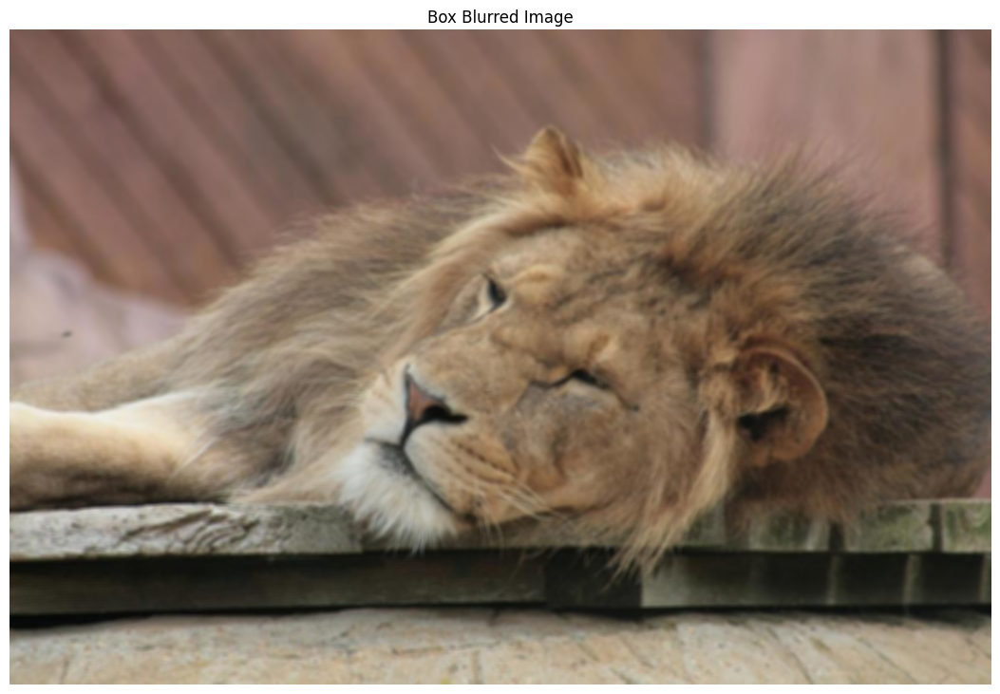

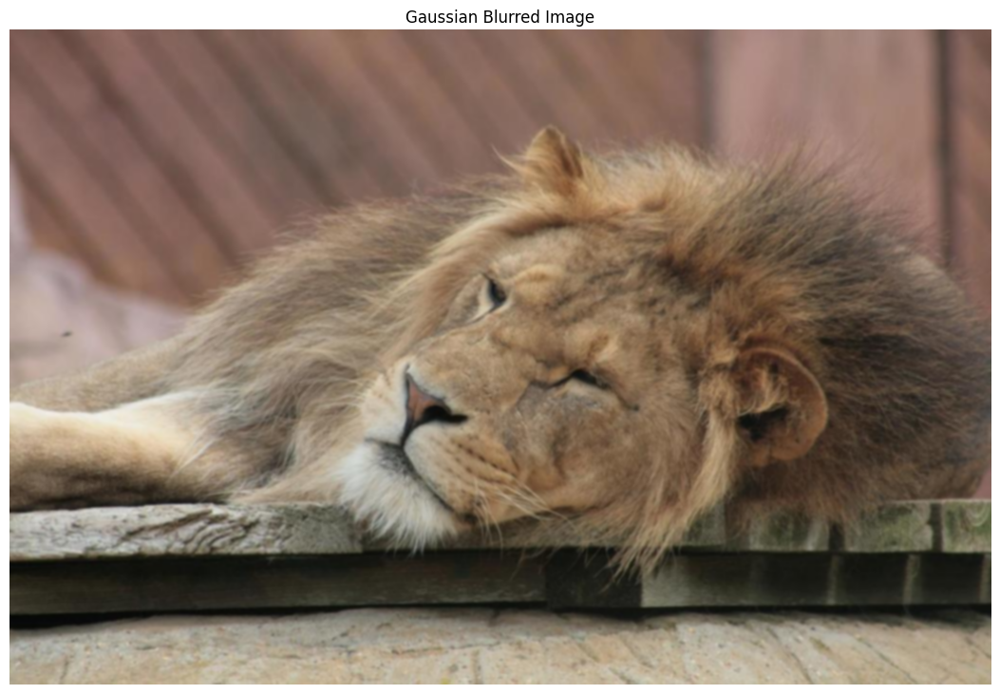

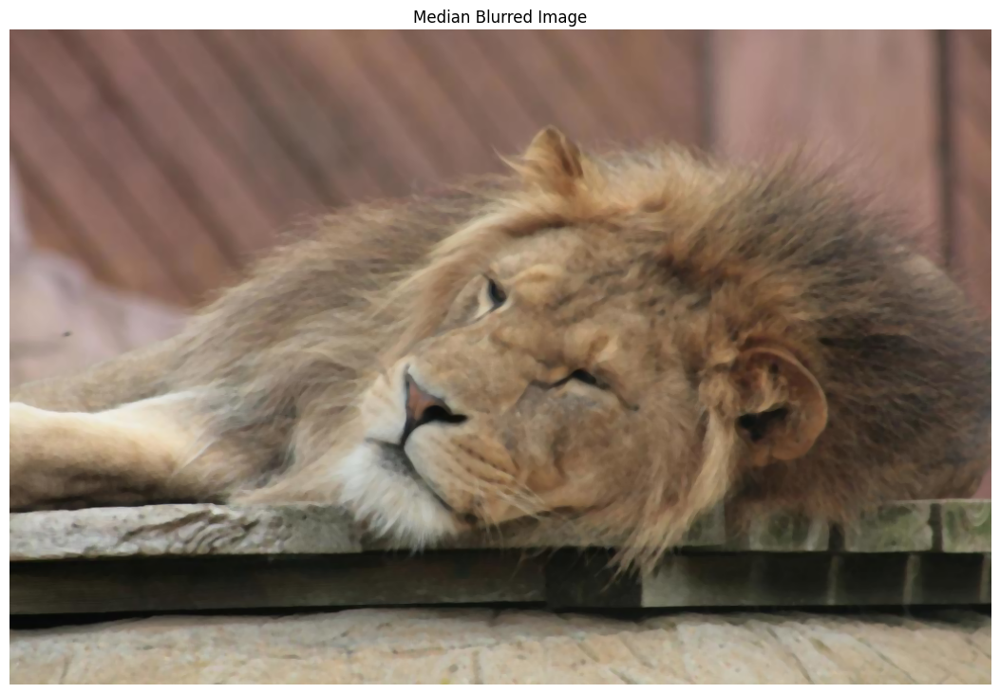

In [33]:
imshow(img, "Original", size=20)

blurred_img = cv2.blur(img, (5, 5))
imshow(blurred_img, "Box Blurred Image", size=20)

blurred_img = cv2.GaussianBlur(img, (5, 5), 0)
imshow(blurred_img, "Gaussian Blurred Image", size=20)

blurred_img = cv2.medianBlur(img, 5)
imshow(blurred_img, "Median Blurred Image", size=20)

---
### Denoising

Using Bilateral Filter

Parameters:
- **src**: Source 8-bit or floating-point, 1-channel or 3-channel image.
- **dst**:	Destination image of the same size and type as src .
- **d**:	Diameter of each pixel neighborhood that is used during filtering. If it is non-positive, it is computed from sigmaSpace.
- **sigmaColor**	Filter sigma in the color space. A larger value of the parameter means that farther colors within the pixel neighborhood (see sigmaSpace) will be mixed together, resulting in larger areas of semi-equal color.
- **sigmaSpace**:	Filter sigma in the coordinate space. A larger value of the parameter means that farther pixels will influence each other as long as their colors are close enough (see sigmaColor ). When d>0, it specifies the neighborhood size regardless of sigmaSpace. Otherwise, d is proportional to sigmaSpace.
- **borderType**:	border mode used to extrapolate pixels outside of the image, see BorderTypes

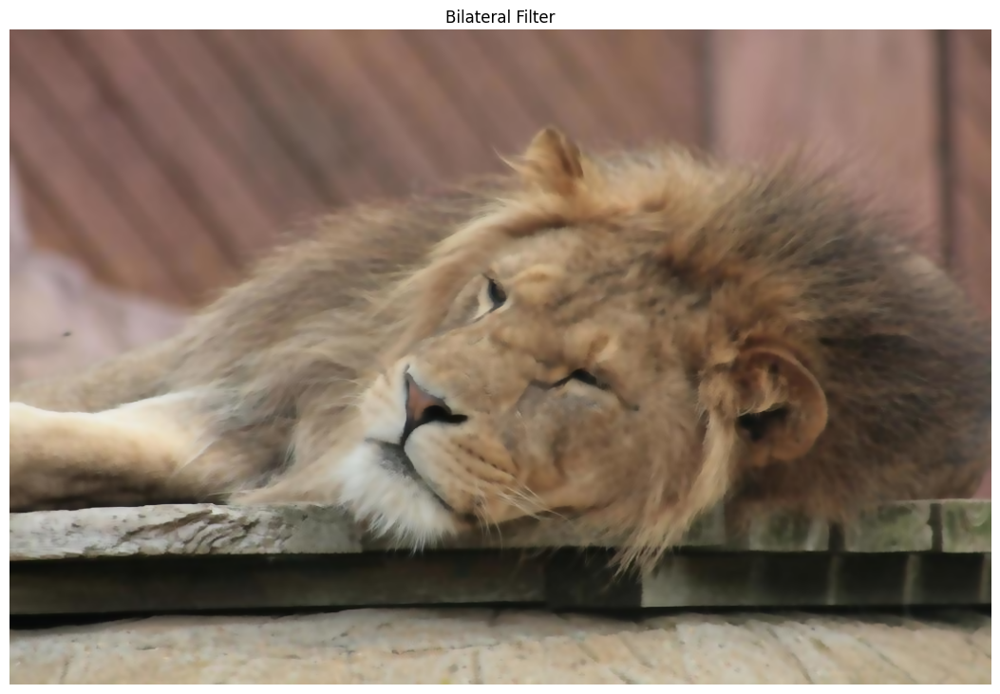

In [35]:
denoising_img = cv2.bilateralFilter(img, 9, 75, 75)
imshow(denoising_img, "Bilateral Filter", size=20)

using fastNlMeansDenoising

Parameters:
- **src**:	Input 8-bit 1-channel, 2-channel, 3-channel or 4-channel image.
- **dst**:	Output image with the same size and type as src .
- **templateWindowSize**:	Size in pixels of the template patch that is used to compute weights. Should be odd. Recommended value 7 pixels
- **searchWindowSize**:	Size in pixels of the window that is used to compute weighted average for given pixel. Should be odd. Affect performance linearly: greater searchWindowsSize - greater denoising time. Recommended value 21 pixels
- **h**:	Parameter regulating filter strength. Big h value perfectly removes noise but also removes image details, smaller h value preserves details but also preserves some noise

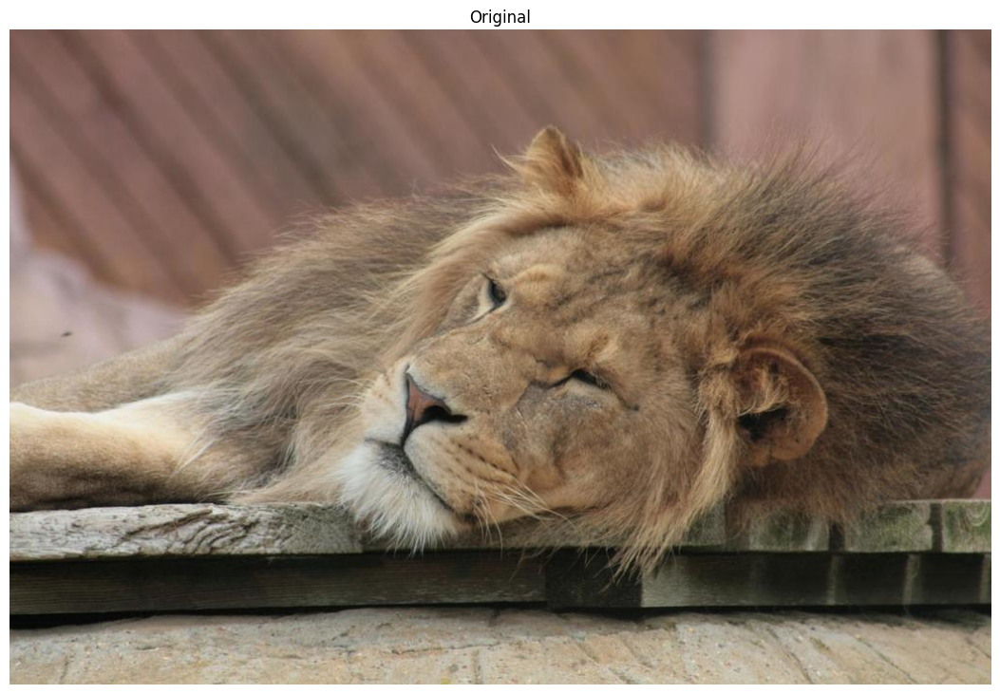

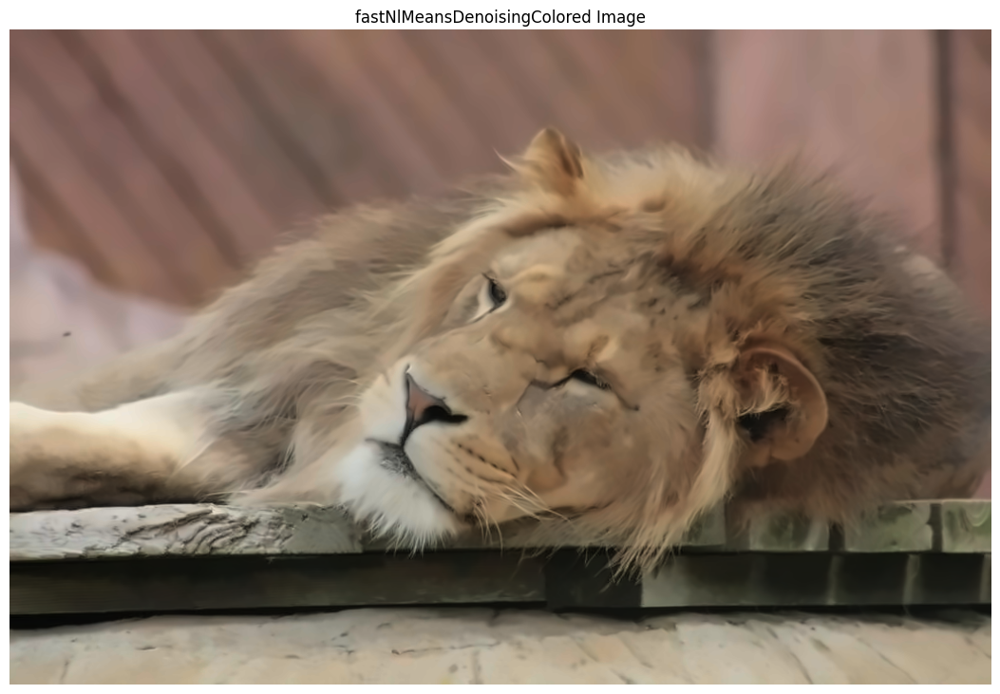

In [36]:
imshow(img, "Original", size=20)

blurred_img = cv2.fastNlMeansDenoisingColored(img, None, 6, 6, 7, 21)
imshow(blurred_img, "fastNlMeansDenoisingColored Image", size=20)

---
### Sharpening

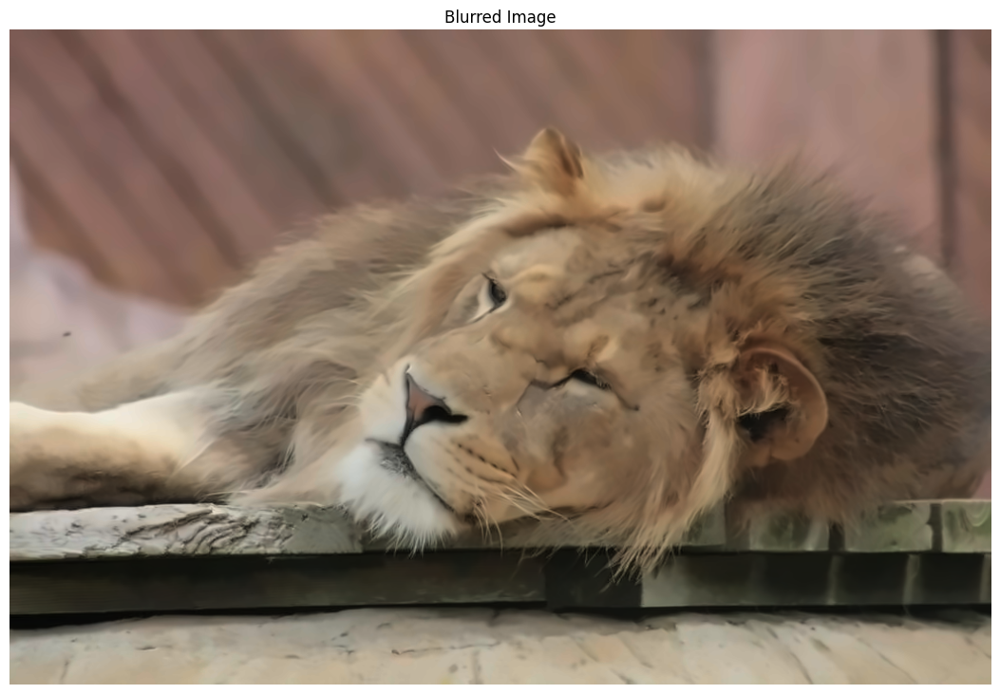

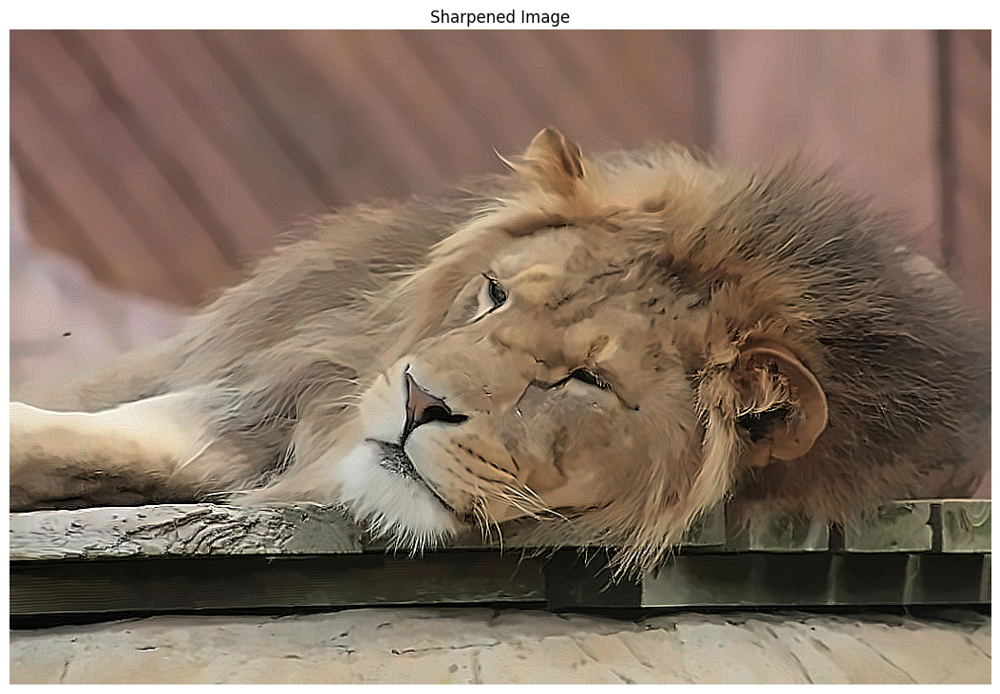

In [38]:
imshow(blurred_img, "Blurred Image", size=20)

kernel = np.array([
    [-1, -1, -1],
    [-1, 9, -1],
    [-1, -1, -1]
])

sharpened_img = cv2.filter2D(blurred_img, -1, kernel)
imshow(sharpened_img, "Sharpened Image", size=20)

---